## Advanced Lane Finding Project

### The goals / steps of this project are the following:

#### Pipeline Processes:
Step 1) Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

Step 2) Apply a distortion correction to raw images.

Step 3) Use color transforms, gradients, etc., to create a thresholded binary image.

Step 4) Apply a perspective transform to rectify binary image ("birds-eye view").

Step 5) Detect lane pixels and fit to find the lane boundary.

Step 6) Determine the curvature of the lane and vehicle position with respect to center.

Step 7) Warp the detected lane boundaries back onto the original image.

Step 8) Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## Helper Function

- This function collection has functions, assisting us to complete each step and debug tracks in the pipeline process. 

In [1]:
# Import necessary libraries for processing detecting a lane
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon
import numpy as np
import cv2
import glob
import os

# Import necessary libraries for video processing
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline


## Step1: Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

&emsp;In this step, we would find how to find camera calibration matrix(abbrev. mtx) and distortion coefficients with a set of chessboard images. In this project, we will use x = 9 and y = 6 instead of x = 8, y = 6 where x counts the number of corners in any row and y does in any column. Here is few processes how camera_calibration function works.

1-1. Receive parameters which are a path saved in images, nx and ny stored x and y values for each.<br></br>

1-2. Create variables of object and image points to distinguish 3-D points and 2-D points.<br></br>

1-3. Convert grayscale images from original images, so that it could find corners of images.<br></br>

1-4. Draw corners for each images and stored those corner coordinates in the variables.<br></br>

1-5. Compute matrix and distorted coefficients by means of object and image points.<br></br>

1-6. return the values of matrix and distorted coefficients.<br></br>


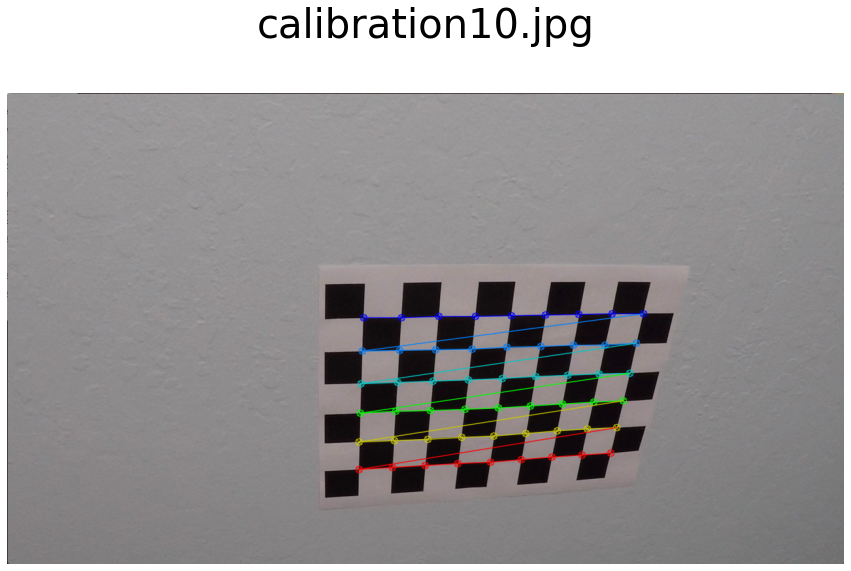

In [2]:
def camera_calibration(img_path, nx=0, ny=0, display=False):
    '''
    @ parameter
    img_path = path of images
    nx = 9 as x object points
    ny = 6 as y object points
    
    @ return
    mtx = camera matrix
    dist = distortion coefficients
    '''
    # Before starting, screen the parameters whether it passes correctly or not
    if nx != 9 or ny != 6:
        raise(NotImplementedError, "Please check nx, ny parameters to pass")
    
    # Make a list of calibration images
    cal_images_names = sorted(glob.glob(img_path))
    
    # Code is from CarND-Camera-Calibration, which is challenge assignment
    # Prepare object points, like (x,y,z) = (0,0,0), (1,0,0), (2,0,0) ....,(9,6,0)
    objp = np.zeros((ny*nx,3), np.float32)
    
    # It means when z = 0, find x and y coordinates
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    
    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(cal_images_names):
        # Read in an image
        img = cv2.imread(fname)
        
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Find chessboard corners where ret is return value(abbrev.)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        # If the corners are found, add object and image points.
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
            # Draw and display the corners in images
            calib_img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            
            # Save and display the calibration images 
            write_name = "./output_images/camera_calibration/calibration" + str(idx) + ".jpg"
            cv2.imwrite(write_name, calib_img)
            
            # Show an example of result
            if idx == 1 and display == True:
                plt.figure(figsize=(15, 10))
                plt.axis('off')
                plt.title(fname.split('/')[-1].split('\\')[-1] + "\n", fontsize = 40)
                plt.imshow(calib_img)
            
    # Do camera calibration given object points and image points
    img_size = gray.shape[::-1]
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    # Those parameters are important to unwarp images since they have calibration values.
    return mtx, dist

# Chess-board parameters
nx, ny = 9, 6

# camera calibration step
mtx, dist = camera_calibration('./camera_cal/calibration*.jpg',nx, ny, True)

## Step 2: Apply a distortion correction to raw images.

&emsp;In this step, we will do how to translate original images into undistorted images. The reason why the original images are distorted is from lens distortion in a camera. To explain the lens distortion, cameras do not create perfect images by optical design of lenses. Specifically, some of the objects in the images such as edges can get stretched or skewed in various way; therefore, we need to correct for them.

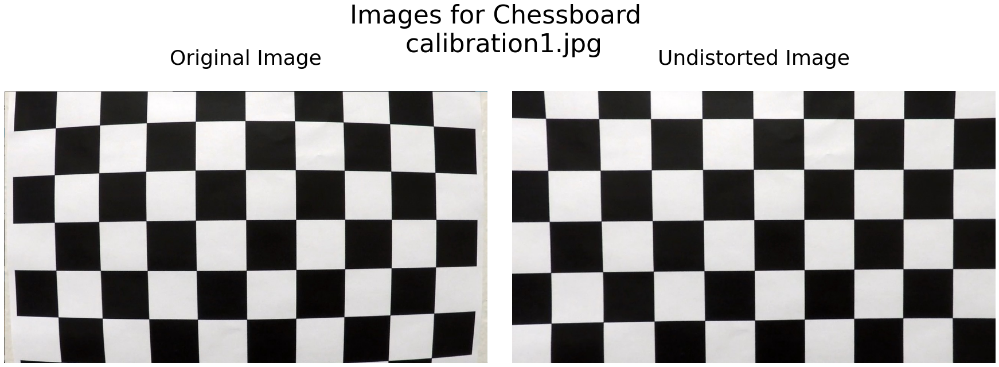

In [3]:
def undistort_func(img, mtx, dist):
    '''
    @ parameter
    img = original image
    mtx = matrix from camera_calibration
    dist = distort coefficient from camera_calibration
    
    @ return
    un_dst = undistorted image
    '''
        
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Undistort the grayscaled images
    un_dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    return un_dst

# Test an image about chessboard
#img = mpimg.imread('./camera_cal/calibration1.jpg')
chessboard_imgs = glob.glob('./camera_cal/calibration*.jpg')

# Undistort chessboard images
for idx, fname in enumerate(chessboard_imgs):
    
    # Read an image
    img = mpimg.imread(fname)
    
    # Undistort the images
    undistorted_img = undistort_func(img, mtx, dist)
    
    # Save the undistorted images 
    write_name = "./output_images/Undistorted_images/undistorted" + str(idx) + ".jpg"
    cv2.imwrite(write_name, np.flip(undistorted_img, axis=-1))
    
    # Left side plot is original(distorted) images whereas right side plot is undistorted images.
    # Show title and subtitle text only if it starts in the beginning
    if idx == 0:
        # Plot the result: distort vs undistort
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        plt.suptitle('Images for Chessboard \n {}'.format(fname.split('/')[-1].split('\\')[-1]), fontsize = 44, y=1.05)
        ax1.set_title('Original Image\n', fontsize = 36)
        ax2.set_title('Undistorted Image\n', fontsize = 36)
    
        # Show left side images
        ax1.imshow(img)
        ax1.axis('off')
    
        # Show right side images
        ax2.imshow(undistorted_img)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        ax2.axis('off')

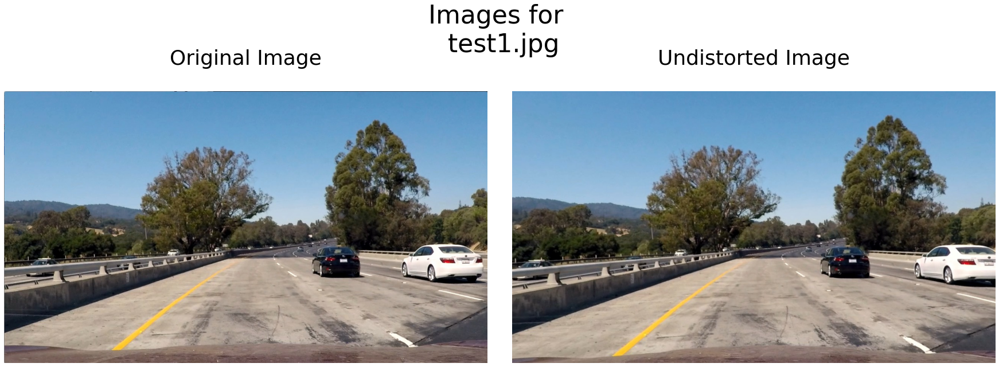

In [4]:
car_imgs = sorted(glob.glob('./test_images/test*.jpg'))

# Undistort car images
for idx, fname in enumerate(car_imgs):
    
    # Read an image
    img = mpimg.imread(fname)
    
    # Undistort the images
    undistorted_img = undistort_func(img, mtx, dist)
    
    # Save the undistorted images 
    write_name = "./output_images/Undistorted_images/undistorted car" + str(idx+1) + ".jpg"
    cv2.imwrite(write_name, np.flip(undistorted_img, axis=-1))
    
    # Left side plot is original(distorted) images whereas right side plot is undistorted images.
    # Show title and subtitle text only if it starts in the beginning
    if idx == 0:
        # Plot the result: distort vs undistort
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        plt.suptitle('Images for \n {}'.format(fname.split('/')[-1].split('\\')[-1]), fontsize = 44, y=1.05)
        ax1.set_title('Original Image\n', fontsize=36)
        ax2.set_title('Undistorted Image\n', fontsize=36)
    
        # Show left side images
        ax1.imshow(img)
        ax1.axis('off')
    
        # Show right side images
        ax2.imshow(undistorted_img)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        ax2.axis('off')

## Step 3: Use color transforms, gradients, etc., to create a thresholded binary image.
&emsp;In this step, we will create color threshold algorithm to output binary images. To detect car lanes, we need binary images to analyze colors for each pixel in the images. First of all, we would analyze original, grayscale image, RGB(Red, Green, Blue) color, HLS(Hue, Lightness, Saturation) color through plots. Then, we would apply thresholds to the test images through various gradients such as sobel operator(x), direction gradients, RGB and HLS thresholds. Briefly, we would do substeps to complete this step.<br></br>

3-1. Import images from test_images directory and distort images using mtx and dist, from which we had already computed camera_calibration function.<br></br>

3-2. Apply gassian blur to the undistorted images to smooth noisy.<br></br>

3-3. Use combined_threshold contained various filters(the gradients and thresholds) to find yellow and white lanes.<br></br>

3-4. Obtain binary images, which the lanes are drawn and save them in output directory as "combined.jpg" separately.<br></br>
    

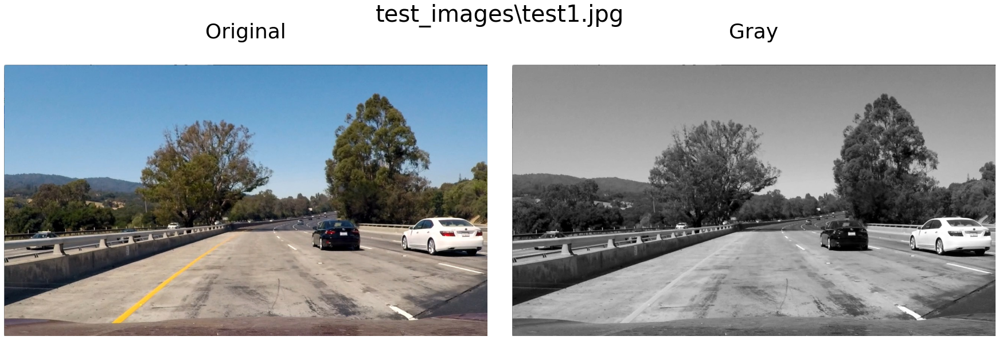

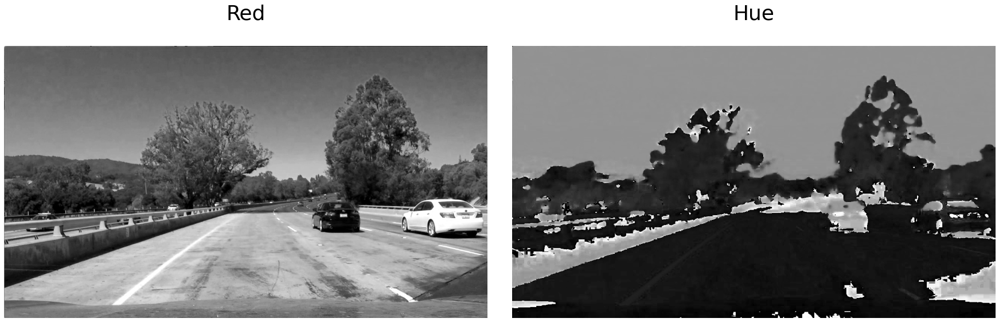

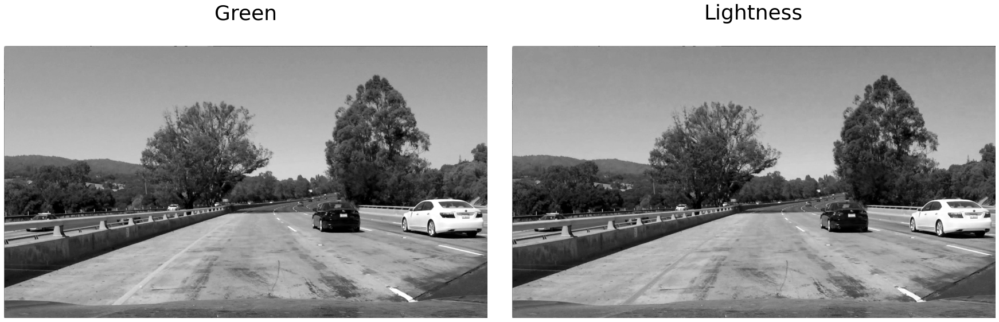

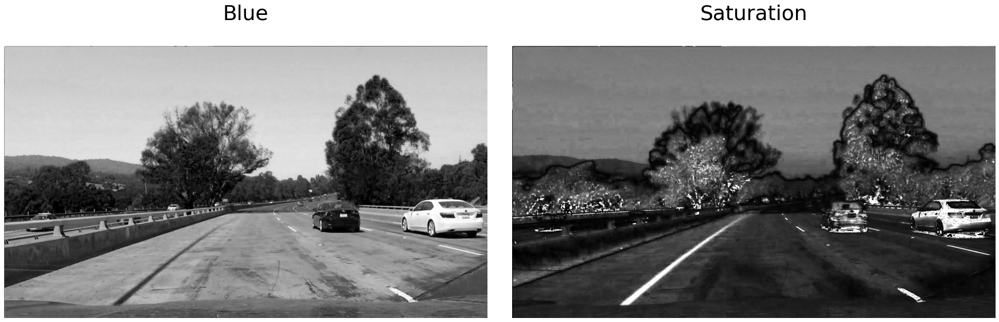

In [5]:
# Analyze colors for car images
car_imgs = glob.glob('./test_images/test*.jpg')

for idx, fname in enumerate(car_imgs):
    
    # Read an image
    img = mpimg.imread(fname)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Separate R, G, B color images to analyze how much R, G, B colors are distributed in car images
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    
    # Convert to HLS color and separate them as hue, lightness, saturation
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    # list for separate results
    img_list = [img, gray, R, H, G, L, B, S]
    name_list = ['Original', 'Gray', 'Red', 'Hue', 'Green', 'Lightness', 'Blue', 'Saturation']
    
    # Since pictures are too many to display, we will save it another directory
    # This is just one example to display how color filters work.
    if idx == 0:
        for i in range(0,len(name_list),2):
            
            # Plot the images and name lists
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
            f.tight_layout()
        
            # Show left side images
            ax1.set_title(f'{name_list[i]}\n', fontsize=36)
            ax1.imshow(img_list[i], cmap='gray')
            ax1.axis('off')
    
            # Show right side images
            ax2.set_title(f'{name_list[i+1]}\n', fontsize=36)
            ax2.imshow(img_list[i+1], cmap='gray')
            plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
            ax2.axis('off')
            if i == 0:
                plt.suptitle(fname.split('/')[-1], fontsize=40)
                
    # Save various color images
    save_dir = "./output_images/{}".format((fname.split('/')[-1]).split('.')[0])
    if not os.path.isdir("./output_images/{}".format((fname.split('/')[-1]).split('.')[0])):
        os.makedirs("./output_images/{}".format((fname.split('/')[-1]).split('.')[0]))
    else:
        for f in glob.glob(os.path.join(save_dir, "*")):
            os.remove(f)
    #for image, name in zip(img_list, name_list):
    for i in range(0, len(img_list)):
        if i == 0:
            write_name = "{}/".format(save_dir) + name_list[i] + ".jpg"
            img_list[0] = np.flip(img, axis=-1)
        else:
            write_name = "{}/".format(save_dir) + name_list[i] + ".jpg"
        cv2.imwrite(write_name, img_list[i])

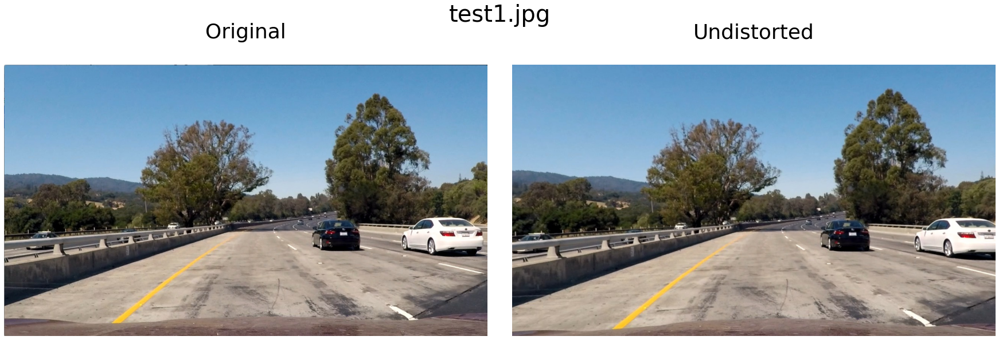

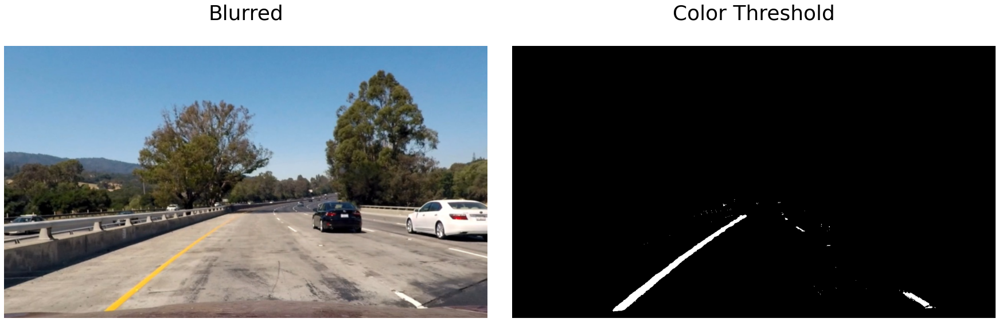

In [6]:

# Sobel gradient from orient 'x' or 'y'
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0,255)):

    '''
    @ parameter
    img = original image
    orient = x or y to determine sobel operator(default = x)
    sobel_kernel = sobel kernel to smooth over noisy intensity fluctuations on small scales.
    thresh = range of threshold (min = 0, max = 255)
    
    @ return
    grad_binary = a binary image filtered by threshold gradient(sobel gradient)
    '''
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient =='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)

    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # 5) Create a mask of 1's where the scaled gradient magnitude is > thresh_min and < thresh_max
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh_min)&(scaled_sobel <= thresh_max)] = 1
    
    # 6) return the mask of as gradient binary image
    return grad_binary


# direction of the gradient
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    '''
    @ parameter
    img = original image
    sobel_kernel = sobel kernel to smooth over noisy intensity fluctuations on small scales.
    thresh = range of direction threshold (min = 0, max = PI/2(90 degree))
    
    @ return
    grad_binary = a binary image filtered by threshold gradient(sobel gradient)
    '''
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir_grad = np.absolute(np.arctan2(abs_sobely, abs_sobelx))
    
    # 5) Create a binary mask where direction thresholds are met
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    
    # 6) Return this mask as your binary_output image
    dir_binary = np.zeros_like(dir_grad)
    dir_binary[(dir_grad >= thresh_min)&(dir_grad <= thresh_max)] = 1
    return dir_binary

def combined_threshold(blurred, ksize=3):
    
    '''
    @ parameter
    blurred = blurred images from original images
    ksize = kernel size
    
    @ return
    combined binary images
    '''
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(blurred, orient='x', sobel_kernel=ksize, thresh=(40, 200))
    dir_binary = dir_threshold(blurred, sobel_kernel=ksize, thresh=(np.pi/6, np.pi/2))
    
    # Combine white parts in gradient x with direction gradient to detect slightly vertical edges of lane curve(white and yellow lanes)
    gradx_dir = ((gradx == 1) & (dir_binary == 1))
    
    # To detect yellow lines more accurately, we need to use R and G colors. Reference: Yellow = Red + Green
    
    RG_threshold = 150
    R = blurred[:,:,0]
    G = blurred[:,:,1]
    
    # Note that red color images detected yellow and white lanes prominently more than others in the pictures above
    binary_mask = np.zeros_like(R)
    RG_combined = ((R > RG_threshold) & (G > RG_threshold))
    
    # Color channel thresholds
    # In this section, we note that S and L are keyword to offset faults of lanes detection
    HLS = cv2.cvtColor(blurred, cv2.COLOR_RGB2HLS)
    L, S = HLS[:,:,1], HLS[:,:,2]
    
    # Saturation is specialized in detecting brightness of yellow and white lanes.
    S_thres_min, S_thres_max = 100, 255
    S_filter = ((S > S_thres_min)&(S <= S_thres_max))
    
    # Lightness is specialized in detecting pixels having dark points such as shadow, so that filter can find shaded lanes.
    L_thres_min, L_thres_max = 120, 255
    L_filter = ((L > L_thres_min)&(L <= L_thres_max))
    
    # Filtered whether the colors of lanes have yellow or white in the red, green mask
    # with sobel & direction, saturation, and lightness filters
    # To detect the lanes should be satistied with as below.
    # Overlap red & green filter, lightness filter, and (sobel x or saturation filter)
    binary_mask[(gradx_dir | S_filter) & (RG_combined & L_filter)] = 1
    
    # Last, we need to set region to detect lanes in the filtered image
    combined_mask = np.zeros_like(binary_mask)
    height, width = blurred.shape[0], blurred.shape[1]
    
    # Need to set width-1, height-1 to prevent out of range
    # Those(3) vertices will make a triangle range to catch the lanes
    region_mask_vertices = [np.array([[0, height-1], [width//2, height//2],[width-1, height-1]], dtype=np.int32)]
    
    #filling pixels inside the polygon defined by "vertices" with the fill color
    cv2.fillPoly(combined_mask, region_mask_vertices, 1)
    
    #returning the binary image detected lanes
    combined = cv2.bitwise_and(binary_mask, combined_mask)
    return combined

# call distorted images we saved in Step 2
imgs = glob.glob('./test_images/test*.jpg')

for idx, fname in enumerate(imgs):
    # same processes above
    img = mpimg.imread(fname)
    
    undistort = undistort_func(img, mtx, dist)
    
    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements
    
    # Applies a Gaussian Noise kernel
    blurred = cv2.GaussianBlur(undistort, (ksize, ksize), 0)
    
    # Obtain combined filtered by various threshold
    combined = combined_threshold(blurred, ksize)
    
    # list for separate results
    img_list = [img, undistort, blurred, combined]
    name_list = ['Original', 'Undistorted', 'Blurred', 'Color Threshold']
    
    if idx == 0:
        for i in range(0,len(name_list),2):
            
            # Plot the images and name lists
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
            f.tight_layout()
        
            # Show left side images
            ax1.set_title(f'{name_list[i]}\n', fontsize=36)
            ax1.imshow(img_list[i], cmap='gray')
            ax1.axis('off')
    
            # Show right side images
            ax2.set_title(f'{name_list[i+1]}\n', fontsize=36)
            ax2.imshow(img_list[i+1], cmap='gray')
            plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
            ax2.axis('off')
            if i == 0:
                plt.suptitle(fname.split('/')[-1].split('\\')[-1], fontsize=40)
                
    # Save results for blurred and combined
    save_dir = "./output_images/{}".format((fname.split('/')[-1]).split('.')[0])
    write_name = "{}/".format(save_dir) + "Blurred.jpg"
    cv2.imwrite(write_name, np.flip(blurred, axis=-1))
    write_name = "{}/".format(save_dir) + "combined.jpg"
    # To save image, we need to multiply 255 to draw detected lanes as white color. Otherwise, the image would be totally black.
    cv2.imwrite(write_name, combined*255)
    
    # To use binary images later step easily, we had better save another file
    save_dir = "./output_images/binary_images"
    if not os.path.isdir(save_dir):
        os.makedirs(save_dir)
    write_name = "{}/".format(save_dir) + fname.split('/')[-1].split('\\')[-1]
    cv2.imwrite(write_name, combined*255)
    

## Step 4: Apply a perspective transform to rectify binary image ("birds-eye view").
&emsp;In step4, we would apply a perspective transform through warp function. This is because we want to measure the curvature of lines. To do it more accurately, we need to analyze two perspectives about driver's view and bird-eye(top-down)'s view after creating the two images for each test image. We could see the results of images in detail in the output_images directory.

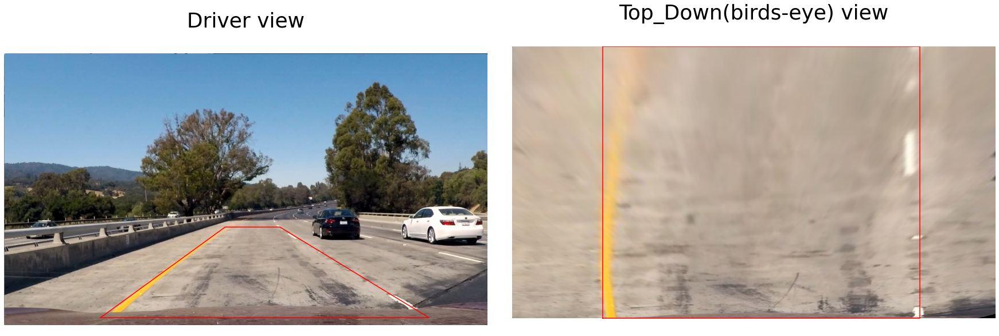

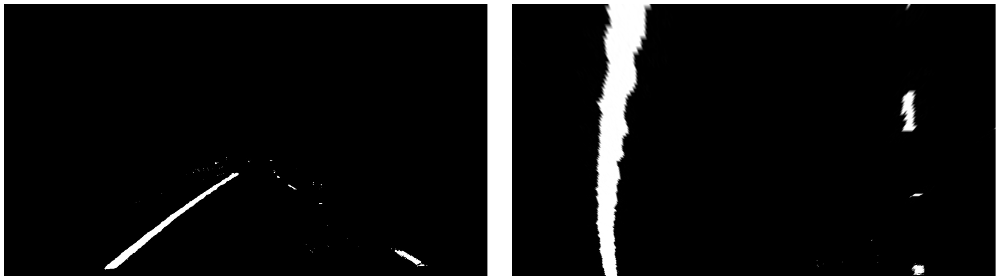

In [7]:
def warp(img):
    """
    @ parameter
    img = undistorted images
    
    @ return
    warped = warped(top-down) image
    src_coordinates = source coordinates for driver's view
    dst_coordinates = destination coordinates for birds-eye view
    Minv = inverse perspective transform matrix
    """
    height, width = img.shape[0], img.shape[1]
    
    # coordinates order should be clockwise round from bottom left to bottom right
    src_coordinates = np.float32(
        [[255, height-20], # Bottom left 
         [585, 460], # Top left
         [730, 460], # Top right
         [1125, height-20]]) # Bottom right
    dst_coordinates = np.float32(
        [[240, height], # Bottom left 
         [240, 0], # Top left
         [1080, 0], # Top right
         [1080, height]]) # Bottom right
    
    # Get M(Tranformed matrix)
    M = cv2.getPerspectiveTransform(src_coordinates, dst_coordinates)
    
    # Compute the inverse perspective transform
    Minv = cv2.getPerspectiveTransform(dst_coordinates, src_coordinates)
    
    # warp images to a top-down view
    warped = cv2.warpPerspective(img, M, (width, height), flags = cv2.INTER_LINEAR)
    
    return warped, src_coordinates, dst_coordinates, Minv

# call distorted images we saved in Step 2
imgs = glob.glob('./test_images/test*.jpg')

# Store M, Minv for use later steps
Minvs = []

for idx, fname in enumerate(imgs):
    # same processes above
    img = mpimg.imread(fname)
    
    undistort = undistort_func(img, mtx, dist)
    
    # Get warp images
    warp_img, src_coordinates, dst_coordinates, Minv = warp(undistort)
    
    # Store Minv for undistorted image
    Minvs.append(Minv)
    
    # list for separate results
    img_list = [img, warp_img]
    name_list = ['Driver view', 'Top_Down(birds-eye) view']
    
    if idx == 0:
        
        # Plot the images and name lists
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        
        # Show left side images
        ax1.set_title(f'{name_list[0]}\n', fontsize=36)
        ax1.imshow(img_list[0], cmap='gray')
        
        # Polygon(src_coordinates).get_xy()[:, 0] => width points of src_coordinates clockwise
        # Polygon(src_coordinates).get_xy()[:, 1] => height points of src_coordinates clockwise
        ax1.plot(Polygon(src_coordinates).get_xy()[:, 0], Polygon(src_coordinates).get_xy()[:, 1], color='red')
        ax1.axis('off')
    
        # Show right side images
        ax2.set_title(f'{name_list[1]}\n', fontsize=36)
        ax2.imshow(img_list[1], cmap='gray')
        
        # Polygon(dst_coordinates).get_xy()[:, 0] => width point of dst_coordinates clockwise
        # Polygon(dst_coordinates).get_xy()[:, 1] => height point of dst_coordinates clockwise
        ax2.plot(Polygon(dst_coordinates).get_xy()[:, 0], Polygon(dst_coordinates).get_xy()[:, 1], color='red')
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        ax2.axis('off')
        if i == 0:
            plt.suptitle(fname.split('/')[-1], fontsize=40)
                
    # Save results for those two views(color images)
    save_dir = "./output_images/{}".format((fname.split('/')[-1]).split('.')[0])
    write_name = "{}/".format(save_dir) + "Driver view.jpg"
    
    # To avoid throw exception, we need to set all coordinates as np.int32 instead of np.float32
    img = cv2.polylines(img, np.int32([src_coordinates]), True, (255, 0, 0), 1)
    cv2.imwrite(write_name, np.flip(img, -1))
    write_name = "{}/".format(save_dir) + "Top_Down(birds-eye) view.jpg"
    warp_img = cv2.polylines(warp_img, np.int32([dst_coordinates]), True, (255, 0, 0), 1)
    cv2.imwrite(write_name, np.flip(warp_img, -1))
    
# Call binary images we did in step 3 asd save warped results for those two views(color images)
imgs = sorted(glob.glob("./output_images/binary_images/test*.jpg"))
for idx, fname in enumerate(imgs):
    # same processes above
    bin_img = mpimg.imread(fname)
    
    # Get warp images
    warp_img, src_coordinates, dst_coordinates, Minv = warp(bin_img)
    
    if idx == 0:
        # Plot the images and name lists
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        
        # Show left side images
        ax1.imshow(bin_img, cmap='gray')
        ax1.axis('off')
    
        # Show right side images
        ax2.imshow(warp_img, cmap='gray')
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        ax2.axis('off')
    save_dir = "./output_images/binary_images"
    write_name = "{}/warp_".format(save_dir) + fname.split('/')[-1].split('\\')[-1]
    cv2.imwrite(write_name, warp_img)


## Step 5: Detect lane pixels and fit to find the lane boundary.
&emsp;In step5, we would detect lanes pixels and fit to find the lane boundry for each image. We set substeps how to process them as below.

5-1) Locate in the lanes lines and find peaks in the histogram.<br></br>
&emsp;Until step 4, we find binary images where the lanes stand out clearly. At this time, we need to decide which pixels are part of the lines and distinguish left and right lines through plotting histograms. The histograms will show where the binary action occur across each image.

5-2) Implement sliding windows and fit a polynomial.<br></br>
&emsp;With a histogram, we see added-up pixel values along each column(x-axis: width) for each image. When we analyze binary images, pixels are either 0 or 1. The two highest prominent values in the histogram indicate x-position(width) of the base of the lanes. We would use those two values as a starting point where to search for the lines. About those points, we would use sliding windows to find polynomial about the curvature left and right lines through find_lane_pixel. This is called a blinded search based on pixel-based methods.<br></br>

5-3) Search around the polynomial we found in step 5-2.<br></br>
&emsp;The blinded search seems inefficient since it works from before and starting fresh on every frame, and the lane lines do not necessarily move a lot from frame to frame. We would use different methods(region-based methods). We also see consecutive frames in the the windows search images are likely to have lane lines in approximately similar positions, so we just search in a margin around the previous lane line position. <br></br>

<Figure size 432x288 with 0 Axes>

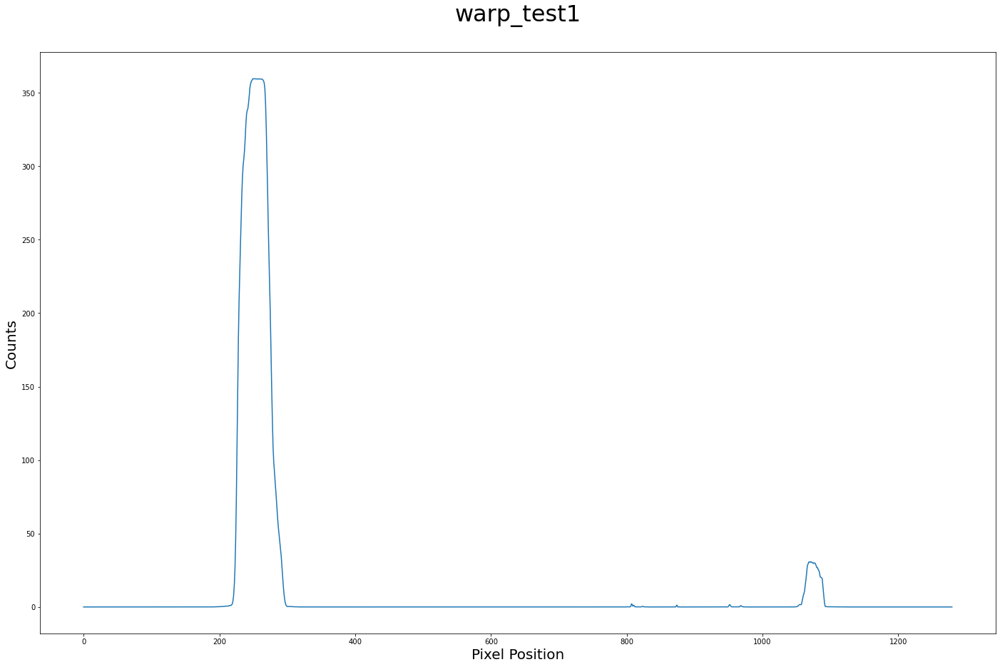

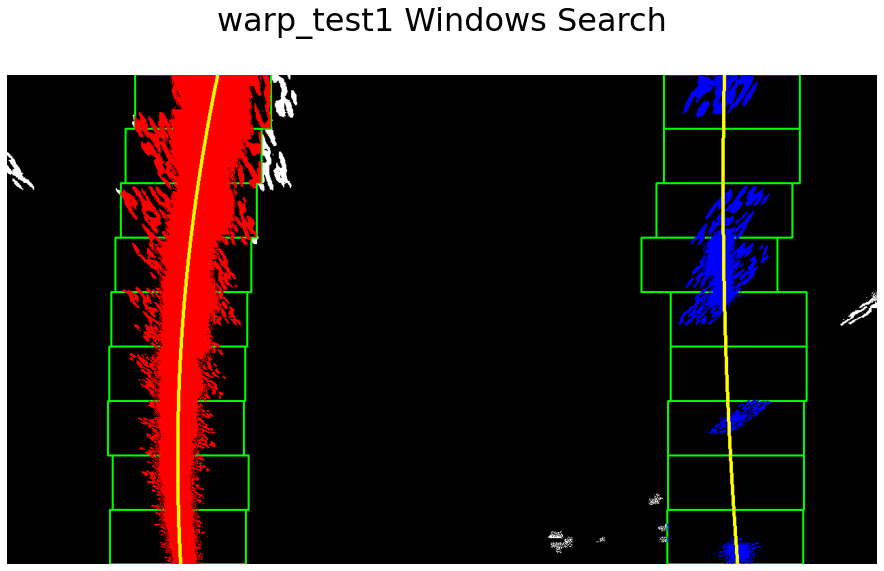

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

In [8]:
# Create histograms and sliding windows image
def hist(bin_img, name = None):
    """
    @ parameter
    bin_img = binary image
    name = filename (default = None)
    
    @ return 
    histogram = histogram for image binary activations
    """
    
    # `mpimg.imread` will load .jpg as 0-255, so normalize back to 0-1
    bin_img = bin_img/255
    
    # Grab only the bottom half of the image
    # Lane lanes are likely to be mostly vertical nearest to the car
    bottom_half = bin_img[bin_img.shape[0]//2:,:]
    
    # Sum across image pixels vertically(i.e. the highest areas of vertical lines should be larger values)
    histogram = np.sum(bottom_half, axis = 0)
    
    # Save this plot when needed to debug later
    # If name is specified to save as file, then save it in binary_images file
    if name != None:
        plt.figure(figsize=(24,9))
        plt.title(name, fontsize = 32)
        plt.xlabel('Pixel Position', fontsize = 20)
        plt.ylabel('Counts', fontsize = 20)
        plt.plot(histogram)
        plt.savefig("./output_images/binary_images/histograms/{}_hist.jpg".format(name))
        plt.clf()
    
    return histogram

def find_lane_pixel(bin_img, name = None):
    """
    @ parameter
    bin_img = warped binary image
    name = filename (default = None to do not save a histogram or image) 
    
    @ return
    leftx = x coordinates for pixels of left lane
    lefty = y coordinates for pixels of left lane
    rightx = x coordinates for pixels of right lane
    righty = y coordinates for pixels of right lane
    out_img = output binary image for drawing range of left and right lanes 
    
    """
    
    # Take a histogram of the bottom half of the image
    histogram = hist(bin_img, name)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((bin_img, bin_img, bin_img))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set up windows and windows hyperparameters
    # Choose the number of sliding windows
    nwindows = 9
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Set the height of the windows - based on nwindows above and and image shape
    windows_height = np.int(bin_img.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in n windows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right line pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Iterate through nwindows to track curvature
    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify windows boundries in x and y (and right and left)
        win_y_low = bin_img.shape[0] - ((window+1) * windows_height)
        win_y_high = bin_img.shape[0] - (window * windows_height)
        
        # Four x boundries of the window
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 2) # left line
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2) # right line
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & 
                          (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &
                          (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
    
    
        # If we found > minpix pixels, recenter next window
        # ('right' or 'left_x_current' on their mean position)
        # Otherwise, the windows show vertically straight rectangles.
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
            
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
        
    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(bin_img, name):
    """
    @ parameter
    bin_img = warped binary image
    name = filename
    
    @ return
    out_img = output images for detected curvature left lane, which is colored red and right lane, which is colored blue
              along with yellow curvature, located in both left and right side.
    left_fit = left polynomial coefficients(a, b, c)
    right_fit = right polynomial coefficients(a', b', c')
    """

    # Find our lane pixels
    leftx, lefty, rightx, righty, out_img = find_lane_pixel(bin_img, name)
    
    # Fit a second order polynomial to each using 'np.polyfit' to find coefficients a, b, c (i.e. y = ax^2 + bx + c)
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, bin_img.shape[0]-1, bin_img.shape[0])
    try:
        left_fitx = left_fit[0]*(ploty**2) + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*(ploty**2) + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if 'left' and 'right_fit' are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*(ploty**2) + 1*(ploty) 
        right_fitx = 1*(ploty**2) + 1*(ploty)
        
    # Visualization
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    # Draw on the polynomial line as yellow
    left_verts = np.array(list(zip(left_fitx.astype(int), ploty.astype(int))))
    right_verts = np.array(list(zip(right_fitx.astype(int), ploty.astype(int))))
    cv2.polylines(out_img, [left_verts], False, (255, 255,0), 3)
    cv2.polylines(out_img, [right_verts], False, (255, 255,0), 3)
    
    return out_img, left_fit, right_fit

imgs = glob.glob("./output_images/binary_images/warp_*.jpg")

# Before saving histograms in a directory, be sure to clear everything in the directory
save_hist_dir = "./output_images/binary_images/histograms"
if not os.path.isdir(save_hist_dir):
    os.makedirs(save_hist_dir)
else:
    for f in glob.glob(os.path.join(save_hist_dir, "*")):
        os.remove(f)

save_win_dir = "./output_images/binary_images/Windows_Search"
if not os.path.isdir(save_win_dir):
    os.makedirs(save_win_dir)
else:
    for f in glob.glob(os.path.join(save_win_dir, "warp_*")):
        os.remove(f)
        
# set list since we need to use those fit polynomial coefficients
left_fit_lists = []
right_fit_lists = []

for idx, fname in enumerate(imgs):
    
    # Load our image
    img = mpimg.imread(fname)
    name = fname.split('/')[-1].split('.')[0].split('\\')[-1]
    
    # Display a histogram and result for first case of test images for an example of histogram in test images.
    if idx == 0:
        plt.clf()
        plt.figure(figsize=(24,15))
        plt.title(name+"\n", fontsize = 32)
        plt.xlabel('Pixel Position', fontsize = 20)
        plt.ylabel('Counts', fontsize = 20)
        plt.plot(hist(img))
        plt.show()
        
        # Show output result      
        out_img, left_fit, right_fit = fit_polynomial(img, name)
        plt.imshow(out_img)
        plt.title(name+" Windows Search\n", fontsize = 32)
        plt.axis('off')
        
    else:
        out_img, left_fit, right_fit = fit_polynomial(img, name)
    
    # save fit polynomial coefficients
    left_fit_lists.append(left_fit)
    right_fit_lists.append(right_fit)
    
    # Save output result
    write_name = "{}/".format(save_win_dir) + fname.split('/')[-1].split('\\')[-1]
    cv2.imwrite(write_name, np.flip(out_img, -1))
    

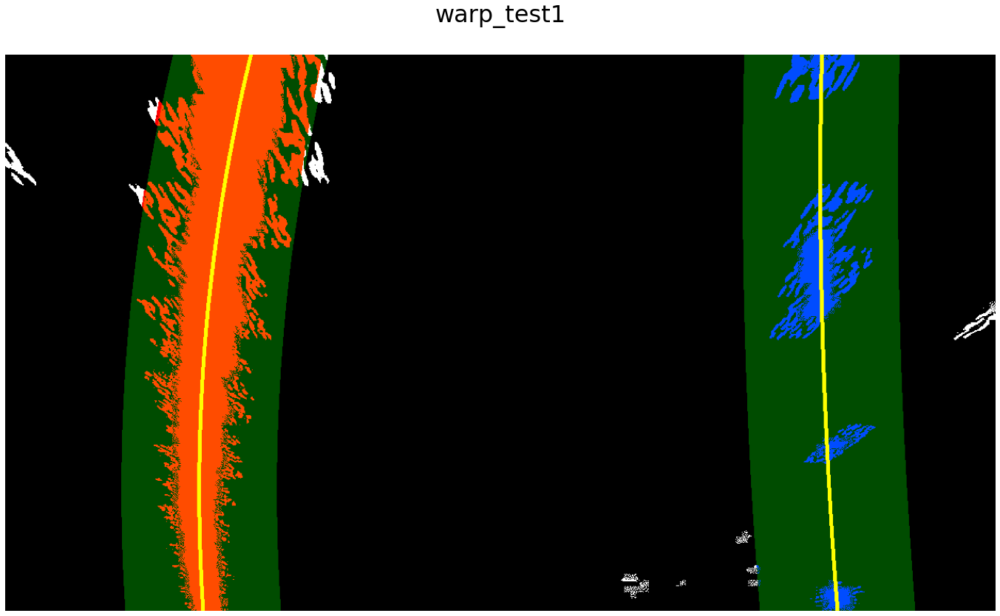

In [9]:
# Search from prior images
# Make sure to grab the actual values for polynomial coefficients and directory path from the previous step!

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    """
    @ parameter
    img_shape = shape(size) of image
    leftx = x coordinates for left line pixel positions
    lefty = y coordinates for left line pixel positions
    rightx = x coordinates for right line pixel positions
    righty = y coordinates for right line pixel positions
    
    @ return
    left_fitx = computed x positions of left side using ploty and left_fit
    right_fitx = computed x positions of right side using ploty and right_fit
    ploty = y values for plotting
    """
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Calculate both polynomials using ploty, left_fit, and right_fit
    left_fitx = left_fit[0]*(ploty**2) + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*(ploty**2) + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty
    

def search_around_poly(wbin_img, left_fit, right_fit):
    '''
    @ parameter
    wbin_img = warped binary image
    left_fit = left line coefficient
    right_fit = right line coefficient
    
    @ return
    left_fitx = x coordinates for the left line equation
    right_fitx = x coordinates for the right line equation
    result = output of images to save
    '''
    # Set margin as a hyperparameter
    margin = 100
    
    # Grab activated pixels
    nonzero = wbin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the area of search based on activated x-values within the +/- margin of our polynomial function
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
                     (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
                      (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Extract left and right line pixel positions again
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(wbin_img.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((wbin_img, wbin_img, wbin_img))*255
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # and then recast the x and y points into usable for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    
    # Draw on the polynomial line as yellow
    left_verts = np.array(list(zip(left_fitx.astype(int), ploty.astype(int))))
    right_verts = np.array(list(zip(right_fitx.astype(int), ploty.astype(int))))
    cv2.polylines(out_img, [left_verts], False, (255, 255,0), 3)
    cv2.polylines(out_img, [right_verts], False, (255, 255,0), 3)
    
    # combined window images with output image and return the result of the image
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return left_fitx, right_fitx, result

# Before proceeding, set a directory to save output images
save_res_dir = "./output_images/binary_images/Windows_Search/result"
if not os.path.isdir(save_res_dir):
    os.makedirs(save_res_dir)
else:
    for f in glob.glob(os.path.join(save_res_dir, "*")):
        os.remove(f)
        
# Create list of Left and right points for each image to use in step 6,7
left_points_list = []
right_points_list = []

for idx, fname in enumerate(imgs):
    
    # Read a warped binary image
    wbin_img = mpimg.imread(fname)
    name = fname.split('/')[-1].split('.')[0].split('\\')[-1]
    
    # Set numpy array version to be compatible
    left_fit = np.array(left_fit_lists[idx])
    right_fit = np.array(right_fit_lists[idx])
    
    # Get a result of input image and save left and right points
    left_fitx, right_fitx, result = search_around_poly(wbin_img, left_fit, right_fit)
    left_points_list.append(left_fitx)
    right_points_list.append(right_fitx)
    
    # Display an example of result
    if idx == 0:
        plt.figure(figsize=(24,15))
        plt.title(name+"\n", fontsize = 32)
        plt.imshow(result)
        plt.axis('off')
    
    # Save images
    write_name = "{}/".format(save_res_dir) + fname.split('/')[-1].split('\\')[-1]
    cv2.imwrite(write_name, np.flip(result, -1))

## Step 6: Determine the curvature of the lane and vehicle position with respect to center.
&emsp; Last step, we made a second order polynomial curve: $f(y) = Ay^2 + By + C$ by means of x, y positions of the lane line pixels. This is because the lane lines in our warped images are curved vertically and shaped like an inverse function about $f(x) = Ax^2 + Bx + C$. Through the curved equation, we would compute the radius of curvature for left and right line for each image where the radius of curvature equation is $$R_{curve} = \frac{[1+(\frac{dx}{dy})^2]^\frac{3}{2}}{|\frac{d^2x}{dy^2}|}$$. 

Through Fundamental of Calculus theorem, we could find two equations: $$f'(y) = \frac{dx}{dy} = 2Ay + B$$ and $$f''(y) = \frac{d^2x}{dy^2} = 2A$$.

Then, $$R_{curve} = \frac{(1+(2Ay+B)^2)^\frac{3}{2}}{|2A|}$$

In [10]:
# Be sure that run step 5. Otherwise, it will make an error.

def measure_curvature(leftx, rightx, img_shape):
    '''
    @ parameters
    leftx = x coordinates of left points about left_fitx
    rightx = x coordinates of right points about right_fitx
    img_shape = size of an input image
    
    @ return
    left_curvature = left radius of curvature(m)
    right_curvature = right radius of curvature(m) 
    '''
    
    # Define conversions in x and y from pixels space to meters
    # We set this by requirement of U.S. regulations for a road
    ym_per_mix = 15./img_shape[0]
    xm_per_mix = 3.7/800
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Reverse to match top-to-bottom in y for left and right line
    leftx = leftx[::-1]
    rightx = rightx[::-1]
    
    # Fit a second order polynomial to pixel positions in each line
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)
    
    left_fitx = left_fit[0]*(ploty**2) + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*(ploty**2) + right_fit[1]*ploty + right_fit[2]
    
    # Convert polynomials to x,y in real world space
    # Define y-value where we want radius of curvature
    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(ploty*ym_per_mix, leftx*xm_per_mix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_mix, rightx*xm_per_mix, 2)
    
    # Implement the calculation of R_curve(radius of curvature)
    left_curvature = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_mix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curvature = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_mix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curvature, right_curvature, ploty

def car_offset(leftx, rightx, img_shape):
    '''
    @ parameters
    leftx = x coordinates of left points about left_fitx
    rightx = x coordinates of right points about right_fitx
    img_shape = size of an input image
    
    @ return
    offset = offset of horizontal car from its center
    '''
    # Set converter from pixel to m
    xm_per_mix = 3.7/800
    
    # Set middle line of width
    mid_x = img_shape[1]//2
    
    # Find car position between the lane(left and right line)
    pos_car = (leftx[-1] + rightx[-1])/2
    
    # Find offset between center and car position
    offset = (mid_x - pos_car) * xm_per_mix
    
    return offset
    
    
for idx, fname in enumerate(imgs):
    
    # Read a warped binary image
    wbin_img = mpimg.imread(fname)
    name = fname.split('/')[-1].split('.')[0].split('\\')[-1]
    left_curvature, right_curvature, ploty = measure_curvature(left_points_list[idx], right_points_list[idx], wbin_img.shape)
    offset = car_offset(left_points_list[idx], right_points_list[idx], wbin_img.shape)
    
    print(name)
    print('Left line curvature: {}m'.format(left_curvature))
    print('Right line curvature: {}m'.format(right_curvature))
    print('Car offset from center {}m\n'.format(offset))

warp_test1
Left line curvature: 222.81208998427115m
Right line curvature: 644.6481181358201m
Car offset from center -0.11984550927483699m

warp_test2
Left line curvature: 170.2105899681526m
Right line curvature: 141.35939515829537m
Car offset from center -0.22207270001202126m

warp_test3
Left line curvature: 112988.96310225231m
Right line curvature: 213.14449720795386m
Car offset from center -0.05939546623463623m

warp_test4
Left line curvature: 287.62242789597m
Right line curvature: 83.38017436509655m
Car offset from center -0.3569606231348878m

warp_test5
Left line curvature: 1798.175035011094m
Right line curvature: 1129.303957085272m
Car offset from center 0.09235704388379527m

warp_test6
Left line curvature: 364.8994492081356m
Right line curvature: 128.58575349540615m
Car offset from center -0.2674597490424035m



## Step7: Warp the detected lane boundaries back onto the original image.
&emsp;In this step, we would paint an image with respect to detecting lane.

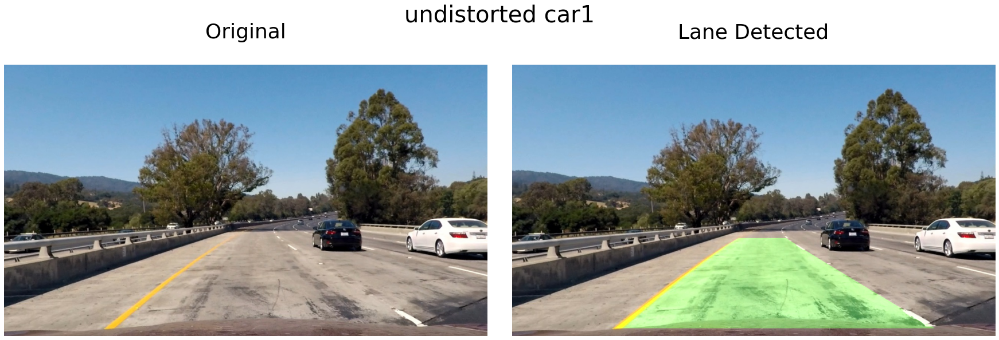

In [11]:
def draw_lane(car_img, warped_img, left_fitx, right_fitx, Minv):
    """
    @ parameter
    car_img = car original image
    warped_img = warped binary image for car
    left_fitx = computed x positions of left side using ploty and left_fit
    right_fitx = computed x positions of right side using ploty and right_fit
    
    @ return
    paint_result = combined a result of image with detecting lane as painting green area
    """
    # Set x and y values for plotting
    ploty = np.linspace(0, car_img.shape[0]-1, car_img.shape[0])
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (car_img.shape[1], car_img.shape[0]))
    
    # Combine the result with the original image
    paint_result = cv2.addWeighted(car_img, 1, newwarp, 0.3, 0)
    
    return paint_result
    

car_imgs = sorted(glob.glob('./output_images/Undistorted_images/undistorted ca*.jpg'))
warped_imgs = sorted(glob.glob('./output_images/binary_images/warp_test*.jpg'))
img_lane_list = []

for idx, bundle_files in enumerate(zip(car_imgs, warped_imgs)):
    
    # Read a warped binary image
    car_img = mpimg.imread(bundle_files[0])
    warped_img = mpimg.imread(bundle_files[1])
    name = bundle_files[0].split('/')[-1].split('.')[0].split('\\')[-1]
    img_lane = draw_lane(car_img, warped_img, left_points_list[idx], right_points_list[idx], Minvs[idx])
    img_lane_list.append(img_lane)
    
    # Plot an example
    if idx == 0:
        # list for separate results
        img_list = [car_img, img_lane]
        name_list = ['Original', 'Lane Detected']
        
        # Plot the images and name lists
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        
        # Show left side images
        ax1.set_title(f'{name_list[0]}\n', fontsize=36)
        ax1.imshow(img_list[0], cmap='gray')
        ax1.axis('off')
    
        # Show right side images
        ax2.set_title(f'{name_list[1]}\n', fontsize=36)
        ax2.imshow(img_list[1], cmap='gray')
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        ax2.axis('off')
        plt.suptitle(name, fontsize=40)

## Step 8: Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

&emsp;Through completion of step 7, we would combine the painted result with metrics we found in step 6.

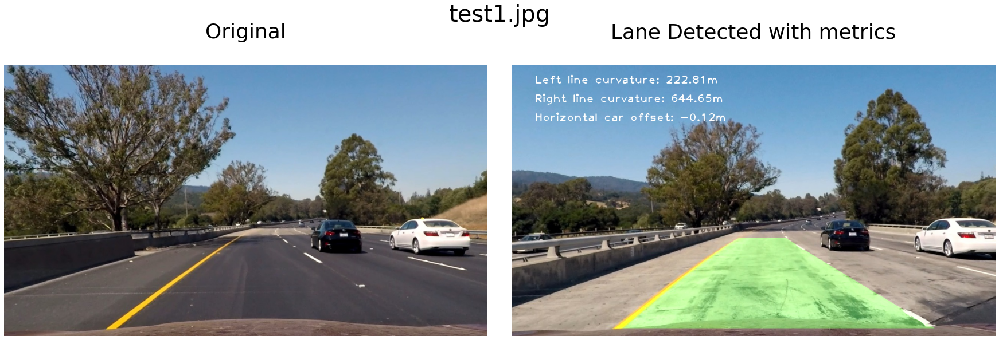

In [12]:
def add_metrics(img_lane, leftx, rightx):
    '''
    @ parameters
    img_lane = Lane Detected image we found in step 7
    leftx = x coordinates of left points about left_fitx
    rightx = x coordinates of right points about right_fitx
    
    @ return
    final_img = final result of image
    '''
    
    # Calculate radius of curvature for left and right line
    left_curvature, right_curvature, ploty = measure_curvature(leftx, rightx, img_lane.shape)
    
    # Find offset between center and car position
    offset = car_offset(leftx, rightx, img_lane.shape)
    
    # Display lane curvature
    final_img = img_lane.copy()
    cv2.putText(final_img, 'Left line curvature: {:.2f}m'.format(left_curvature),
                (60, 50), cv2.FONT_HERSHEY_PLAIN, 2, (255, 255, 255), 2)
    cv2.putText(final_img, 'Right line curvature: {:.2f}m'.format(right_curvature),
                (60, 100), cv2.FONT_HERSHEY_PLAIN, 2, (255, 255, 255), 2)
    cv2.putText(final_img, 'Horizontal car offset: {:.2f}m'.format(offset),
                (60, 150), cv2.FONT_HERSHEY_PLAIN, 2, (255, 255, 255), 2)
    
    return final_img

# Before proceeding, set a directory to save output images
save_dir = "./output_images/final_result"
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
else:
    for f in glob.glob(os.path.join(save_dir, "*")):
        os.remove(f)
name = car_imgs[0].split("/")[-1]

for idx, img_lane in enumerate(img_lane_list):
    # Create final result of image
    final_img = add_metrics(img_lane, left_points_list[idx], right_points_list[idx])
    
    # Plot an example
    if idx == 0:
        # list for separate results
        img_list = [car_img, final_img]
        name_list = ['Original', 'Lane Detected with metrics']
        
        # Plot the images and name lists
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        
        # Show left side images
        ax1.set_title(f'{name_list[0]}\n', fontsize=36)
        ax1.imshow(img_list[0], cmap='gray')
        ax1.axis('off')
    
        # Show right side images
        ax2.set_title(f'{name_list[1]}\n', fontsize=36)
        ax2.imshow(img_list[1], cmap='gray')
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        ax2.axis('off')
        plt.suptitle("test{}.jpg\n".format(idx+1), fontsize=40)
   
    # Save images
    write_name = "{}/".format(save_dir) + "test{}.jpg".format(idx+1)
    cv2.imwrite(write_name, np.flip(final_img, -1))
    

## Wrap-up: Combine all steps as a pipeline in a video.

In [13]:
class Pipeline():
    def __init__(self, calib_path):
        """
        @ parameter
        calib_path = a path with respect to directory stored images for camera calibration
        
        """
        # Set step 1 for camera calibration
        mtx, dist = camera_calibration(calib_path, 9, 6)
        self.mtx = mtx
        self.dist = dist
        
    # When we call this function
    def __call__(self, img, name = None):
        
        """
        @ parameter
        img = original image
        name = name for an image(This is only for debug). If we set None, the function will not save a result of image.
        
        @ return
        final_result = an image detected a lane flexibly
        """
        
        
        # Apply a distortion correction to raw images(Step 2)
        undistort_img = undistort_func(img, self.mtx, self.dist)
        # Choose a Sobel kernel size
        ksize = 3 # Choose a larger odd number to smooth gradient measurements
        # Applies a Gaussian Noise kernel
        blurred = cv2.GaussianBlur(undistort_img, (ksize, ksize), 0)
        
        # Use color transforms, gradients, etc., to create a thresholded binary image(Step 3)
        combined = combined_threshold(blurred, ksize)
        
        # Apply a perspective transform to rectify binary image ("birds-eye view")(Step 4)
        warp_img, src_coordinates, dst_coordinates, Minv = warp(combined)
        
        # Detect lane pixels and fit to find the lane boundary(Step 5)
        out_img, left_fit, right_fit = fit_polynomial(warp_img, name)
        left_fitx, right_fitx, result = search_around_poly(warp_img, left_fit, right_fit)
        
        # Warp the detected lane boundaries back onto the original image(Step 6)
        left_curvature, right_curvature, ploty = measure_curvature(left_fitx, right_fitx, warp_img.shape)
        offset = car_offset(left_fitx, right_fitx, warp_img.shape)
        
        # Warp the detected lane boundaries back onto the original image(Step 7)
        img_lane = draw_lane(undistort_img, warp_img, left_fitx, right_fitx, Minv)
        
        # Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position(Step 8)
        final_result = add_metrics(img_lane, left_fitx, right_fitx)
        
        return final_result

## Unittest time
&emsp;After completing the pipeline, we need to test cases as given images and videos. Then, we would save them in a directory("./output_images/pipeline_final_result"). We finally check final results of images in the existed directory("./output_images/final_result") we did in step 8 versus directory("./output_images/pipeline_final_result") to do quality check before testing in videos.

<Figure size 1728x648 with 0 Axes>

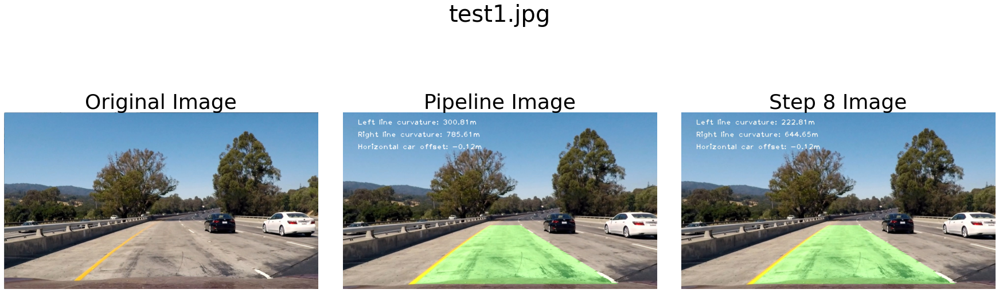

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

<Figure size 1728x648 with 0 Axes>

In [14]:
car_imgs = sorted(glob.glob('./test_images/test*.jpg'))
Process_test = Pipeline('./camera_cal/calibration*.jpg')
prev_fin_imgs = sorted(glob.glob('./output_images/final_result/test*.jpg'))
save_dir = "./output_images/pipeline_final_result"
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
else:
    for f in glob.glob(os.path.join(save_dir, "*")):
        os.remove(f)

for idx, fname in enumerate(zip(car_imgs, prev_fin_imgs)):
    # Read an image
    img = mpimg.imread(fname[0])
    prev_fin_img = mpimg.imread(fname[1])
    name = fname[0].split('/')[-1].split('\\')[-1]
    
    # Apply pipeline
    unittest = Process_test(img, name)
    
    if idx == 0:
        # Plot the 3 images
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=36)
        ax1.axis('off')
        ax2.imshow(unittest, cmap='gray')
        ax2.set_title('Pipeline Image', fontsize=36)
        ax2.axis('off')
        ax3.imshow(prev_fin_img, cmap='gray')
        ax3.set_title('Step 8 Image', fontsize=36)
        ax3.axis('off')
        plt.suptitle("test{}.jpg\n".format(idx+1), fontsize=40)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
        
    # Save images
    write_name = "{}/".format(save_dir) + "test{}.jpg".format(idx+1)
    cv2.imwrite(write_name, np.flip(unittest, -1))

&emsp; When we check all the images in the directory("./output_images/pipeline_final_result") and the directory("./output_images/final_result"), the results of images for pipeline is better than previous results of images in the directory("./output_images/final_result"). At this time, we would test it in the video how they works and evaluate the performance.

In [15]:
def test_video(input_video, output_video):
    """
    @ parameter
    input_video = original video
    output_video = final result of video being able to detect a lane
    """
    
    # Process Video for testing passing through Pipeline class
    video_test = Pipeline('./camera_cal/calibration*.jpg')
    
    # Check the process of video
    clip1 = VideoFileClip(input_video)
    white_clip = clip1.fl_image(video_test)
    %time white_clip.write_videofile(output_video, audio=False)
    
    print("Create a video passing through pipeline. Successful!")

# Test Video
input_video = './project_video.mp4'
output_video = './project_video_output.mp4'

test_video(input_video, output_video)

Moviepy - Building video ./project_video_output.mp4.
Moviepy - Writing video ./project_video_output.mp4



Moviepy - Done !
Moviepy - video ready ./project_video_output.mp4
Wall time: 3min 47s
Create a video passing through pipeline. Successful!


In [16]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format(output_video))

## Challenge video
&emsp; We ran the project video and output our ideal result succesfully! In this time, we attempt to test another video how it works and check quality.